In [2]:
!conda --version

conda 24.7.1


In [1]:
from moviepy.editor import VideoFileClip

def export_audio_from_video(video_path, audio_path=None):
    # Загрузка видеофайла
    video_clip = VideoFileClip(video_path)

    # Извлечение аудио дорожки
    audio_clip = video_clip.audio

    # Сохранение аудио в файл
    audio_clip.write_audiofile(audio_path if audio_path else 'clip_sound.wav')


In [193]:
REF = 10

In [250]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, Cropping2D
from tensorflow.keras.models import Model

# Создание модели U-Net
def unet_model(input_size=(None, None, 1)):
    inputs = Input(input_size)
    print(inputs.shape)
    # Энкодер
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    print(conv1.shape)
    pool1 = MaxPooling2D(pool_size=(2, 2), padding='same')(conv1)
    print(pool1.shape)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    print(conv2.shape)
    pool2 = MaxPooling2D(pool_size=(2, 2), padding='same')(conv2)
    print(pool2.shape)

    # Боттлнек
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    print(conv3.shape)

    # Декодер
    up1 = UpSampling2D(size=(2, 2))(conv3)
    print(up1.shape)
    
    # cropped_tensor1 = Cropping2D(cropping=((0, 0), (1, 0)))(up1)
    
    merge1 = Concatenate()([conv2, up1])
    print(merge1.shape)
    conv4 = Conv2D(128, 3, activation='relu', padding='same')(merge1)
    print(conv4.shape)

    up2 = UpSampling2D(size=(2, 2))(conv4)
    print(up2.shape)
    
    # cropped_tensor2 = Cropping2D(cropping=((0, 0), (1, 0)))(up2)
    
    merge2 = Concatenate()([conv1, up2])
    print(merge2.shape)
    conv5 = Conv2D(64, 3, activation='relu', padding='same')(merge2)
    print(conv5.shape)

    # Выходной слой
    outputs = Conv2D(1, 1, activation='sigmoid')(conv5)
    print(outputs.shape)

    # Создание модели
    model = Model(inputs=inputs, outputs=outputs)
    return model

# Создание и компиляция модели
model = unet_model(input_size=(512, 512, 1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Пример тренировки (перед использованием нужно подготовить данные X_train, y_train)
# model.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_val, y_val))


(None, 512, 512, 1)
(None, 512, 512, 64)
(None, 256, 256, 64)
(None, 256, 256, 128)
(None, 128, 128, 128)
(None, 128, 128, 256)
(None, 256, 256, 256)
(None, 256, 256, 384)
(None, 256, 256, 128)
(None, 512, 512, 128)
(None, 512, 512, 192)
(None, 512, 512, 64)
(None, 512, 512, 1)


In [198]:
import numpy as np
import librosa
import os
from tqdm.auto import tqdm
from sklearn.model_selection import train_test_split

In [217]:
def load_audio(file_path, sr=16000):
    # Загрузка аудиофайла
    y, sr = librosa.load(file_path, sr=sr)
    return y, sr

def audio_to_spectrogram(audio, n_fft=1024, hop_length=512):
    # Преобразование аудиосигнала в спектрограмму
    S = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
    S_db = librosa.amplitude_to_db(np.abs(S), ref=REF)
    return S_db


In [267]:
from scipy.ndimage import zoom

def resize_spectrogram(spectrogram, target_shape=(512, 512)):
    return zoom(spectrogram, (target_shape[0] / spectrogram.shape[0], target_shape[1] / spectrogram.shape[1]))

def prepare_spectrograms(noisy_spectrograms, clean_spectrograms, max_len=256):
    # Преобразуем спектрограммы в необходимые размеры для подачи в модель
    X = []
    y = []

    for i in tqdm(range(len(noisy_spectrograms))):
        # Предполагается, что спектрограммы уже подготовлены как 2D массивы
        noisy_spec = noisy_spectrograms[i]
        clean_spec = clean_spectrograms[i]
        
        X.append(resize_spectrogram(noisy_spec))
        y.append(resize_spectrogram(clean_spec))
    
    X = np.array(X)
    y = np.array(y)
    print(X.shape)
    # Добавляем размерность для подачи в Conv2D
    X = np.expand_dims(X, axis=-1)
    y = np.expand_dims(y, axis=-1)
    
    return X, y

In [273]:
def prepare_train():
    X = []
    y = []
    files = os.listdir('data/noised_speech')
    for filename in tqdm(files):
        try:
            noised, noised_sr = load_audio(f'data/noised_speech/{filename}')
            clean, clean_sr = load_audio(f'data/clean_speech/{filename}')
            X.append(audio_to_spectrogram(noised))
            y.append(audio_to_spectrogram(clean))
        except:
            continue
    print(X[0].shape)

    return prepare_spectrograms(X, y) 

def prepare_train_test():
    X = []
    y = []
    files = os.listdir('data/noised_speech')
    for filename in tqdm(files):
        try:
            noised, noised_sr = load_audio(f'data/noised_speech/{filename}')
            clean, clean_sr = load_audio(f'data/clean_speech/{filename}')
            X.append(audio_to_spectrogram(noised))
            y.append(audio_to_spectrogram(clean))
        except:
            continue
    print(X[0].shape)
    X_ready, y_ready = prepare_spectrograms(X, y) 
    return train_test_split(X_ready, y_ready, test_size=0.2, random_state=42)

In [274]:
X_train, y_train = prepare_train()

  0%|          | 0/2685 [00:00<?, ?it/s]

(513, 680)


  0%|          | 0/2609 [00:00<?, ?it/s]

(2609, 512, 512)


In [270]:
X_train.shape

(1, 2609, 512, 512, 1)

In [264]:
# X_train, X_test, y_train, y_test = prepare_train_test()


In [ ]:
# Обучение модели
model.fit(X_train, y_train, epochs=5, batch_size=8, validation_split=0.2)


Epoch 1/5
142/261 ━━━━━━━━━━━━━━━━━━━━ 36:21 18s/step - loss: 3540.2356

In [ ]:
model.save('model_v2.keras')

In [36]:
# os.listdir()

['main.ipynb',
 '.DS_Store',
 'env_tf',
 'SPEAKERS.csv',
 '.ipynb_checkpoints',
 'data',
 'data noising.ipynb']

In [ ]:
def soft_mask(S, threshold):
    return S * (S > threshold)
    
def denoise_audio(noisy_audio_file, model):
    # Загрузка и преобразование аудио в спектрограмму
    noisy_audio, sr = load_audio(noisy_audio_file)
    display(IPython.display.Audio(noisy_audio, rate=sr))
    # Преобразуем аудио в спектрограмму
    noisy_spectrogram = librosa.stft(noisy_audio)
    noisy_spectrogram_shape = noisy_spectrogram.shape
    noisy_spectrogram_resized = resize_spectrogram(noisy_spectrogram)

    # Преобразуем амплитудную спектрограмму в логарифмическую шкалу (децибелы)
    noisy_db = librosa.amplitude_to_db(np.abs(noisy_spectrogram_resized), ref=ref)

    # Подготовка данных
    input_spec = np.expand_dims(noisy_db, axis=(0, -1))
    
    # Прогон через модель
    denoised_spec = model.predict(input_spec)
    
    # Преобразование обратно в аудиосигнал
    denoised_spec = denoised_spec[0, :, :, 0]  # Убираем лишние измерения
    
    # Обратное преобразование из спектрограммы в аудиосигнал
    S_recovered = librosa.db_to_amplitude(denoised_spec, ref=ref)
    
    # Используем мягкое подавление для слабых сигналов
    S_recovered_resized = resize_spectrogram(noisy_spectrogram, noisy_spectrogram_shape)

    # Применение мягкого подавления
    S_soft_masked = soft_mask(S_recovered_resized, threshold=0.02)
    
    # Восстанавливаем аудио через Griffin-Lim
    denoised_audio = librosa.griffinlim(S_soft_masked)
    display(IPython.display.Audio(denoised_audio, rate=sr))
    
    return denoised_audio, sr


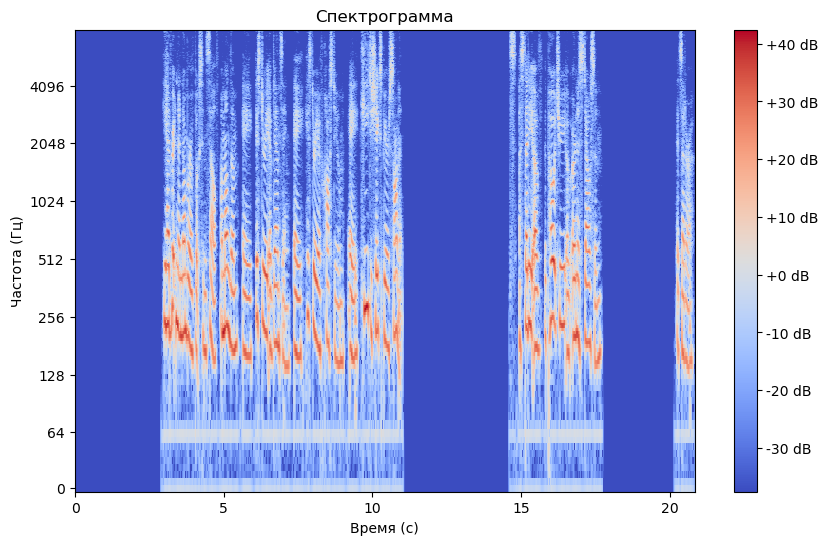

In [179]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Загружаем аудиофайл
audio_data, sr = librosa.load('./data/clean_speech/female_1462-170138-0000.wav', sr=None)
display(IPython.display.Audio(audio_data, rate=sr))

# Преобразование аудиосигнала в спектрограмму с использованием STFT
S = np.abs(librosa.stft(audio_data))

# Преобразование амплитуд в децибелы для логарифмической шкалы
S_db = librosa.amplitude_to_db(S, ref=1)

# Построение спектрограммы
plt.figure(figsize=(10, 6))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Спектрограмма')
plt.xlabel('Время (с)')
plt.ylabel('Частота (Гц)')
plt.show()

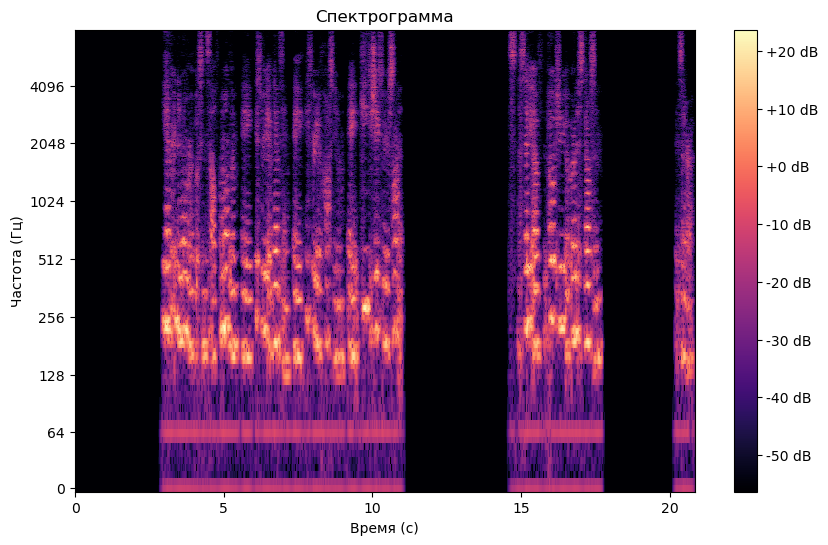

In [180]:
audio_data, sr = librosa.istft(librosa.db_to_amplitude(S_db, ref=1)), 16000
display(IPython.display.Audio(audio_data, rate=sr))

# Преобразование аудиосигнала в спектрограмму с использованием STFT
S = np.abs(librosa.stft(audio_data))

# Преобразование амплитуд в децибелы для логарифмической шкалы
S_db = librosa.amplitude_to_db(S, ref=1)

# Построение спектрограммы
plt.figure(figsize=(10, 6))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Спектрограмма')
plt.xlabel('Время (с)')
plt.ylabel('Частота (Гц)')
plt.show()

In [181]:

# Загружаем аудиофайл
audio_data, sr = librosa.load('./data/clean_speech/female_1462-170138-0000.wav', sr=None)

# Преобразование аудио в спектрограмму с сохранением фазовой информации
S_complex = librosa.stft(audio_data)  # Комплексная спектрограмма (амплитуды и фазы)

# Восстановление аудио обратно из спектрограммы
reconstructed_audio = librosa.istft(S_complex)

# Сравнение исходного и восстановленного аудио
print("Исходное аудио:")
display(IPython.display.Audio(audio_data, rate=sr))

print("Восстановленное аудио:")
IPython.display.Audio(reconstructed_audio, rate=sr)

Исходное аудио:


Восстановленное аудио:


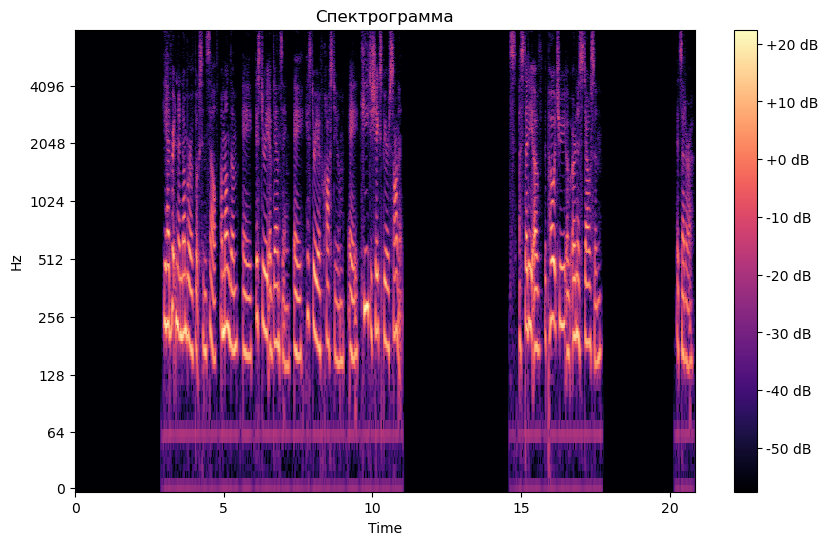

In [222]:
ref = 10
# Загружаем аудиофайл
audio_data, sr = librosa.load('./data/clean_speech/female_1462-170138-0000.wav', sr=None)
display(IPython.display.Audio(audio_data, rate=sr))

# Устанавливаем параметры STFT
# n_fft = 1024  # Размер окна (может быть 1024 или 2048, в зависимости от сигнала)
# hop_length = n_fft // 4  # Обычно hop_length — четверть от n_fft

# Преобразуем аудио в спектрограмму
S = librosa.stft(audio_data)

# Преобразуем амплитудную спектрограмму в логарифмическую шкалу (децибелы)
S_db = librosa.amplitude_to_db(np.abs(S), ref=ref)

# Визуализируем спектрограмму
plt.figure(figsize=(10, 6))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Спектрограмма')
plt.show()

# Обратное преобразование из спектрограммы в аудиосигнал
S_recovered = librosa.db_to_amplitude(S_db, ref=ref)

# Восстанавливаем аудио с использованием тех же параметров
audio_reconstructed = librosa.istft(S_recovered)

# Воспроизведение восстановленного аудио
display(IPython.display.Audio(audio_reconstructed, rate=sr))



# Используем мягкое подавление для слабых сигналов
def soft_mask(S, threshold):
    return S * (S > threshold)

# Применение мягкого подавления
S_soft_masked = soft_mask(S_recovered, threshold=0.02)

# Восстанавливаем аудио через Griffin-Lim
g_ = librosa.griffinlim(S_soft_masked)
display(IPython.display.Audio(g_, rate=sr))

In [187]:
denoise_audio('./data/noised_speech/female_1462-170138-0000.wav', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


(array([ 9.1048969e-05, -3.6061252e-04,  1.2717657e-04, ...,
        -2.2984708e-03, -2.1208958e-03, -1.7396378e-03], dtype=float32),
 16000)

In [223]:
os.listdir('data/noised_speech')[0]

'male_3000-15664-0011.wav'

In [241]:
ref = 10
# Загружаем аудиофайл
audio_data, sr = librosa.load('./data/noised_speech/' + os.listdir('data/noised_speech')[0], sr=None)
librosa.stft(audio_data).shape
display(IPython.display.Audio(audio_data, rate=sr))

In [263]:

# Обратное преобразование из спектрограммы в аудиосигнал
S_recovered = librosa.db_to_amplitude(X_train[0][0], ref=REF)
S_recovered_resized = resize_spectrogram(S_recovered[:, :, 0], target_shape = librosa.stft(audio_data).shape)
# Восстанавливаем аудио с использованием тех же параметров
audio_reconstructed = librosa.istft(S_recovered_resized, n_fft=2048, hop_length=512)

# Воспроизведение восстановленного аудио
display(IPython.display.Audio(audio_reconstructed, rate=sr))



# Используем мягкое подавление для слабых сигналов
def soft_mask(S, threshold):
    return S * (S > threshold)

# Применение мягкого подавления
S_soft_masked = soft_mask(S_recovered_resized, threshold=0.02)

# Восстанавливаем аудио через Griffin-Lim
g_ = librosa.griffinlim(S_soft_masked)
display(IPython.display.Audio(g_, rate=sr))

In [207]:
X_train.shape

(1, 2609, 256, 256, 1)